In [1]:
import glob
import multiprocessing as mp
import matplotlib.pyplot as plt
import numpy as np
import os
import oscdeeppy as odp
from importlib import reload

# Image Lists

In [71]:
DTYPE = np.float32 # Not sure what int types will do; float64 is probably overkill 
BLACKPOINT_SIGMA=2.7 # Larger tends to make darker images
SYMMETRY_SIGMA = 0.5 # offset from background peak in terms of backgroun sigma for stretching

ImageSet = odp.FITSSet
bias = glob.glob('../astro/asi2600mc_calibrations/bias_n10C/*.fits')
darks_180 = glob.glob('../astro/asi2600mc_calibrations/dark_n10C_180s/*.fits')
darks_300 = glob.glob('../astro/asi2600mc_calibrations/dark_n10C_300s/*.fits')
FLAT_DARK_SCALING_FACTOR = 0.0
LIGHT_DARK_SCALING_FACTOR = 1.0

darks = darks_300
flats = glob.glob('../astro/2024-09-08*/*Triangulum*/Flat/*.fits')
lights = glob.glob('../astro/2024*Veil*/Light/*.fits')
DRIZZLE = True
tag = 'ngc6992_veil_nebula_asi2600mc'

#darks = darks_300
#flats = glob.glob('../astro/2024-09-08*/*Triangulum*/Flat/*.fits')
#lights = glob.glob('../astro/2024-09-08*/*Triangulum*/Light/*.fits')
#DRIZZLE = True
#tag = 'm33_triangulum_asi2600mc'




#bias = glob.glob('bias/*.ARW')[:100]
#darks = glob.glob('darks/*.ARW')[:100]
#DARK_EXPOSURE_TIME = 30
#ImageSet = odp.RawSet

#flats = glob.glob('../astro/2024-02-24*/flats/*.ARW')
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/10s exposures vs 30s exposures
#lights = glob.glob('../astro/2024-02-24*/lights/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 240/DARK_EXPOSURE_TIME # 240s exposures vs 30s exposures
#DRIZZLE = True
#tag = 'm101_whirlpool' # FIXME double check

#flats = glob.glob('../astro/2023-12-15*/Clean Flats/*.ARW') # Did I really not take flats for orion...
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/10s exposures vs 30s exposures
#lights = glob.glob('../astro/2023-12-13*/Orion*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 120/DARK_EXPOSURE_TIME # 120s exposures vs 30s exposures
#DRIZZLE = True
#tag = 'orion_nebula'

#flats = glob.glob('../astro/2024-02-08*/flats/*.ARW')
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/2024-02-08*/M81*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 300/DARK_EXPOSURE_TIME # 300s exposures vs 30s exposures
#DRIZZLE = True
#tag = 'm81_bode_m82_cigar_v2'

#flats = glob.glob('../astro/2023-12-15*/Clean Flats/*.ARW')
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/2023-12-15*/Andromeda*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 300/DARK_EXPOSURE_TIME # 300 exposures vs 30s exposures
#DRIZZLE = True
#tag = 'andromeda'

#flats = glob.glob('../astro/2023-12-15*/Clean Flats/*.ARW')
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/2023-12-15*/Triangulum*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 300/DARK_EXPOSURE_TIME # 300 exposures vs 30s exposures
#DRIZZLE = True
#tag = 'triangulum'

#flats = glob.glob('../astro/*M51*/flats/*.ARW')[:100]
#lights = glob.glob('../astro/*M51*/*M51*/*.ARW')
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 15.) # 1/15s exposures vs 30s exposures
#LIGHT_DARK_SCALING_FACTOR = 240/DARK_EXPOSURE_TIME # 240 exposures vs 30s exposures
#DRIZZLE = True
#tag = 'm51_whirlpool_galaxy'

#flats = glob.glob('../astro/*Leo Triplet*/flats/*.ARW')[:100]
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 15.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/*Leo Triplet*/*Leo Triplet*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 240/DARK_EXPOSURE_TIME # 240 exposures vs 30s exposures
#DRIZZLE = True
#tag = 'leo_triplet'

#flats = glob.glob('flats_v3/*.ARW')[:100]
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 15.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/*Markarian*/*Markarian*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 500/DARK_EXPOSURE_TIME # 500s exposures vs 30s exposures
#DRIZZLE = True
#tag = 'markarians_chain_v5'

#flats = glob.glob('flats_v3/*.ARW')[:100]
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 15.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/*Lagoon*/Lagoon*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 300/DARK_EXPOSURE_TIME # 300 exposures vs 30s exposures
#DRIZZLE = True
#tag = 'lagoon_nebula_v2'

print(len(bias),len(flats),len(darks),len(lights))

100 100 50 25


# Calibration Data Processing

In order to image very dim objects, one requires a very sensitive and very well calibrated sensor. Data taken in contrived situations (very short exposure, lens cap on or off, pointed at uniform white surface, etc) provide footholds for calculating unknown quantities in the imaging system, like precise per-pixel sensitivity, positions of dust shadows, hot/dead pixels etc.

## Bias

Bias frames are taken fast at the same gain as light and dark to capture constant offsets in all images.

In [72]:
bias_set = ImageSet(bias)

### Stacking

In [73]:
bias_avg = odp.simple_stack(bias_set, dtype=DTYPE, verbose=True)

### Histogram

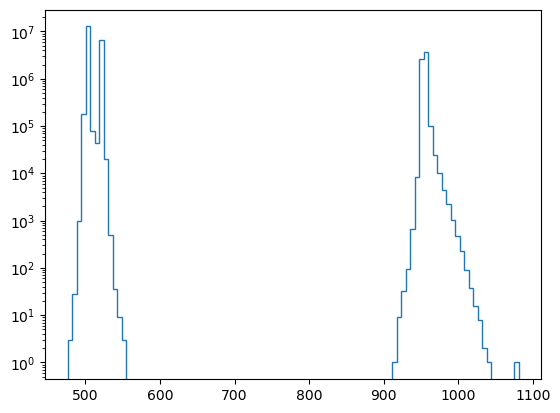

In [74]:
plt.hist(bias_avg.flatten(), bins=100, histtype='step',label='Bias Avg')
plt.yscale('log')

## Dark

Dark frames are long exposure at the same gain as light frames, but with the sensor dark. These capture noise that builds with time. Helpful to have the same exposure time as light frames, but can be scaled to compensate. The bias must be subtracted from the dark frames.

In [75]:
dark_set = ImageSet(darks)

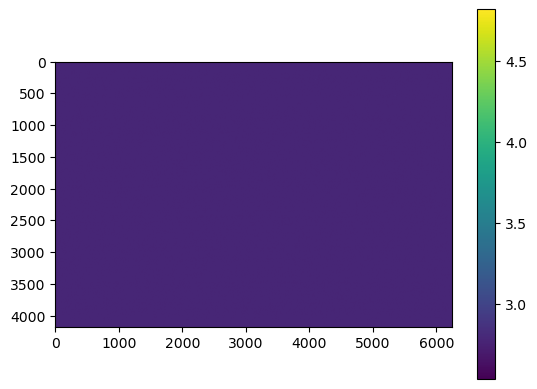

In [76]:
plt.imshow(np.log10(np.clip(dark_set[0],1e-15,None)))
plt.colorbar()

### Stacking

In [77]:
dark_avg = odp.simple_stack(dark_set, dtype=DTYPE, verbose=True)

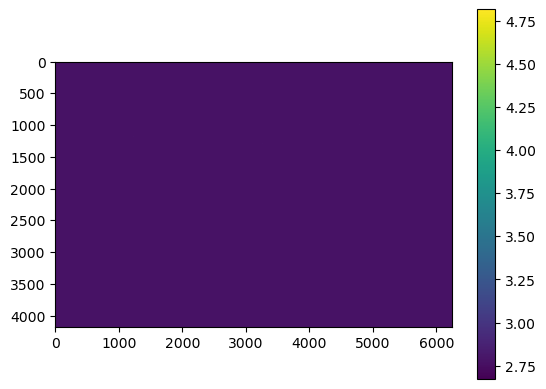

In [78]:
plt.imshow(np.log10(np.clip(dark_avg,1e-15,None)))
plt.colorbar()

### Bias Subtraction

In [79]:
dark_unbiased = dark_avg - bias_avg

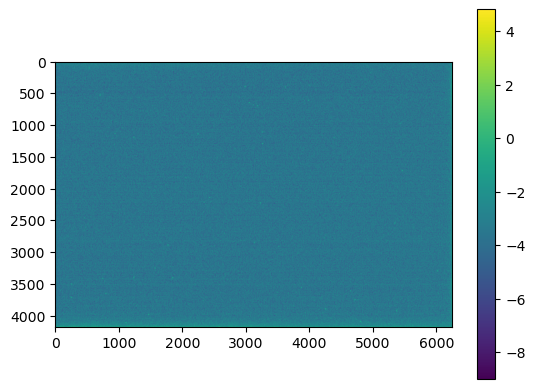

In [80]:
plt.imshow(np.log10(np.clip(dark_unbiased,1e-9,None)))
plt.colorbar()

### Histogram

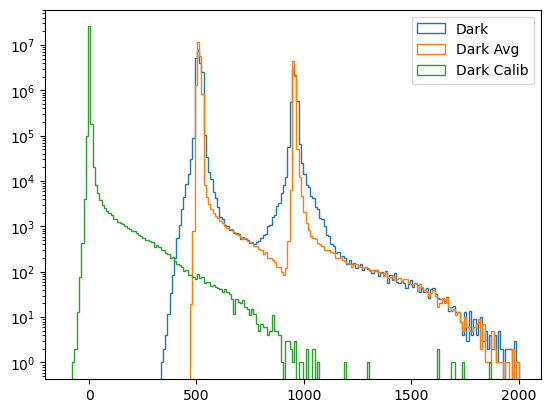

In [81]:
plt.hist(dark_set[0].ravel(), bins=np.linspace(-100,2000,200), histtype='step',label='Dark')
plt.hist(dark_avg.ravel(), bins=np.linspace(-100,2000,200), histtype='step',label='Dark Avg')
plt.hist(dark_unbiased.ravel(), bins=np.linspace(-100,2000,200), histtype='step',label='Dark Calib')
plt.yscale('log')
plt.legend()

## Flat

Flats capture nonuniform response to light in the optical system due to imperfections in the telescope/lens, dust on the sensor, or senor response itself. This corrects for effects similar to vignetting as well. The bias (recommended) and darks (optional) should be subtracted from the flats. Flats are normalized so that the multiplicative effect does not modify the mean intensity of a uniform image.

In [82]:
flat_set = ImageSet(flats)

### Bias & Dark Subtraction

In [83]:
def bias_dark_subtact(img, bias, dark, factor):
    return img - bias - dark*factor

In [84]:
flat_calib_set = odp.DiskSet('flat_calib.apy',recreate=True, dtype=DTYPE, num_img=len(flat_set), img_shape=flat_set.img_shape)

with odp.ImageProcessor(nproc=16) as proc:
    proc.map(bias_dark_subtact, flat_set, args=(bias_avg, dark_unbiased, FLAT_DARK_SCALING_FACTOR), output_set=flat_calib_set, verbose=True)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:33<00:00,  3.02it/s]


### Stacking

In [85]:
flat_avg = odp.simple_stack(flat_calib_set, dtype=DTYPE, verbose=True)

### Debayering

In [86]:
flat_debayer = odp.debayer_full(flat_avg)

### Normalization

In [87]:
flat_norm = flat_debayer/np.mean(np.mean(flat_debayer,axis=0),axis=0)
flat_norm[flat_norm == 0.0] = 1.0

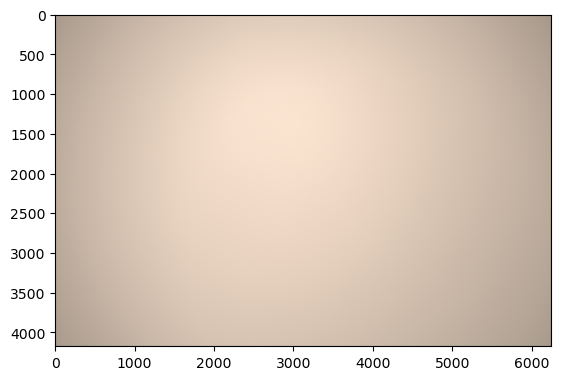

In [88]:
odp.display_rgb(flat_norm)

# Light Image Processing

In [89]:
light_set = ImageSet(lights)

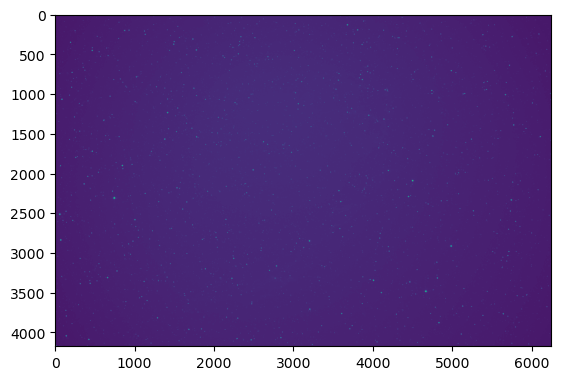

In [90]:
plt.imshow(light_set[0])

## Bias, Dark, & Flat Calibration + Debayer

In [91]:
bias_master = bias_avg
dark_master = dark_unbiased
flat_master = flat_norm

def calibrate_light_img(img, dark_factor):
    '''
    dark_master and flat_master should be bias subtracted
    '''
    return odp.debayer_full(img - bias_master - dark_master*dark_factor) / flat_master

In [92]:
light_calib_set = odp.DiskSet('light_calib.apy',recreate=True, dtype=DTYPE, num_img=len(light_set), img_shape=light_set.img_shape+(3,))

with odp.ImageProcessor(nproc=16) as proc:
    proc.map(calibrate_light_img, light_set, args=(LIGHT_DARK_SCALING_FACTOR,), output_set=light_calib_set, verbose=True)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:16<00:00,  1.53it/s]


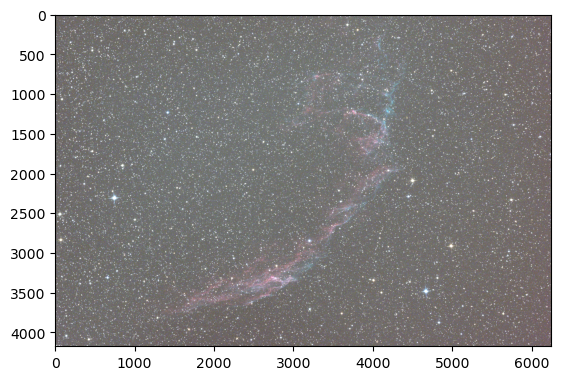

In [93]:
odp.display_rgb(light_calib_set[0], scale='auto')

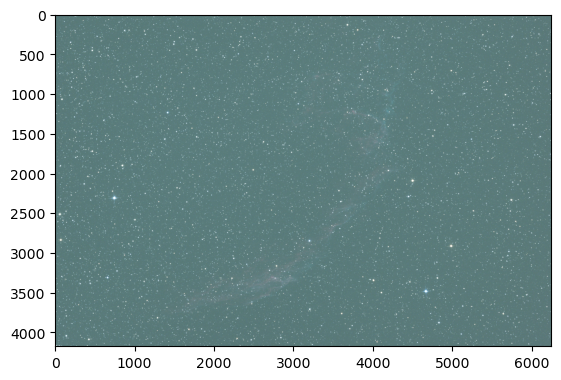

In [94]:
odp.display_rgb(light_calib_set[0], scale='linear', clip_sigmas=5)

## Background Extraction

In [95]:
light_calib_bkg_set = odp.DiskSet('light_calib_bkg.apy',recreate=True, dtype=DTYPE, num_img=len(light_calib_set), img_shape=light_calib_set.img_shape)

with odp.ImageProcessor(nproc=16) as proc:
    proc.map(odp.polyfit_bkg_extract, light_calib_set, output_set=light_calib_bkg_set, verbose=True)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [01:25<00:00,  3.43s/it]


Image 0


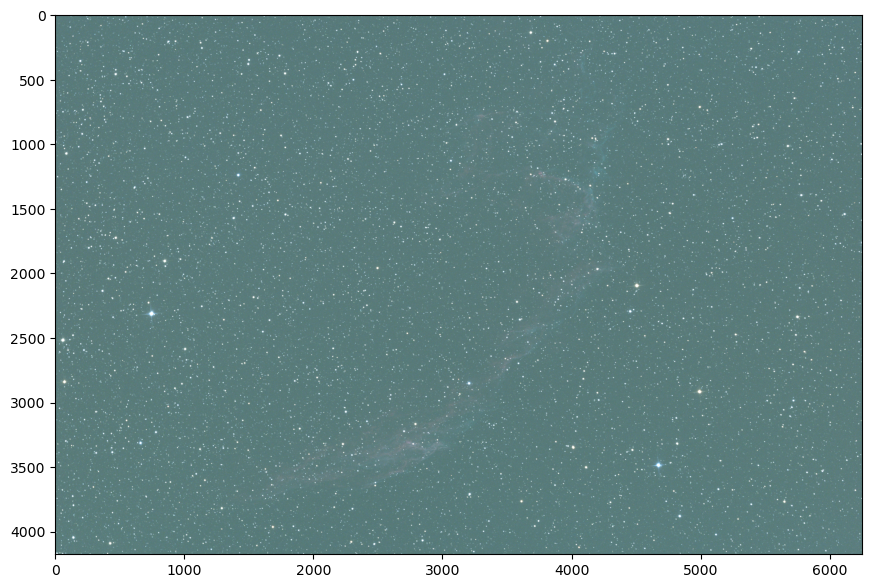

In [96]:
for i in range(len(light_calib_bkg_set)):
    print(f'Image {i}')
    plt.figure(figsize=[14,7])
    odp.display_rgb(light_calib_bkg_set[i],scale='linear',clip_sigmas=5)
    plt.show()
    plt.close()
    break

## Find Stars

Fit(531): Optimization terminated successfully.
FWHM 14.156628268830685 ECC 0.20370193780482562 SNR 15.124680792741458 LVL 71266.31439822102 DIST 0.9000980786617524


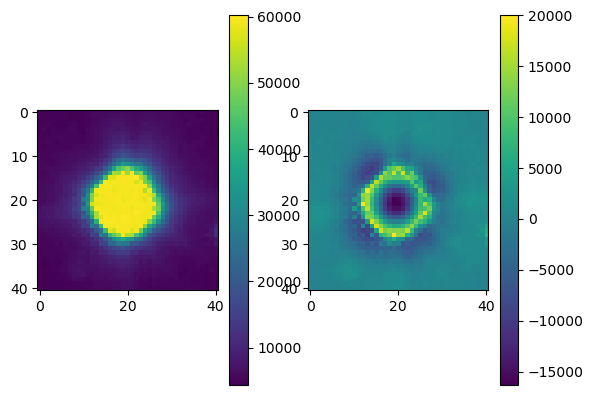

Fit(472): Optimization terminated successfully.
FWHM 13.045145891490902 ECC 0.40681562889116313 SNR 15.701426812663476 LVL 74271.92794743019 DIST 0.8443421915953685


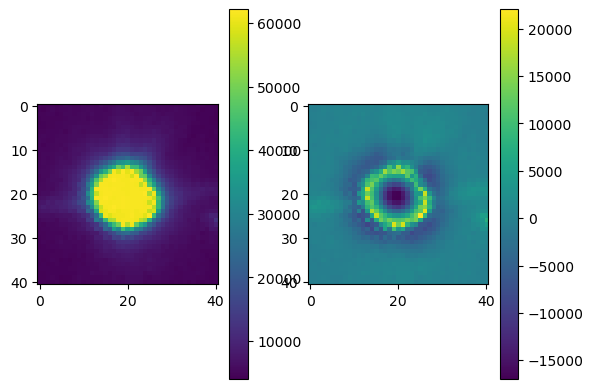

array([[7.46515541e+02, 2.31375860e+03, 1.41566283e+01, 7.12663144e+04,
        4.71192188e+03, 2.03701938e-01],
       [4.67146908e+03, 3.48765654e+03, 1.30451459e+01, 7.42719279e+04,
        4.73026616e+03, 4.06815629e-01]])

In [97]:
#Just to demo
odp.find_stars(light_calib_bkg_set[0], num_stars=2, patch_radius=20, snr_min=5, verbose=True)

In [98]:
with odp.ImageProcessor(nproc=16) as proc:
    reg_stars = proc.map(odp.find_stars, light_calib_bkg_set, num_stars=250, patch_radius=20, snr_min=5, verbose=True)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:32<00:00,  1.30s/it]


Image 0 FWHM 6.160 ECC 0.552


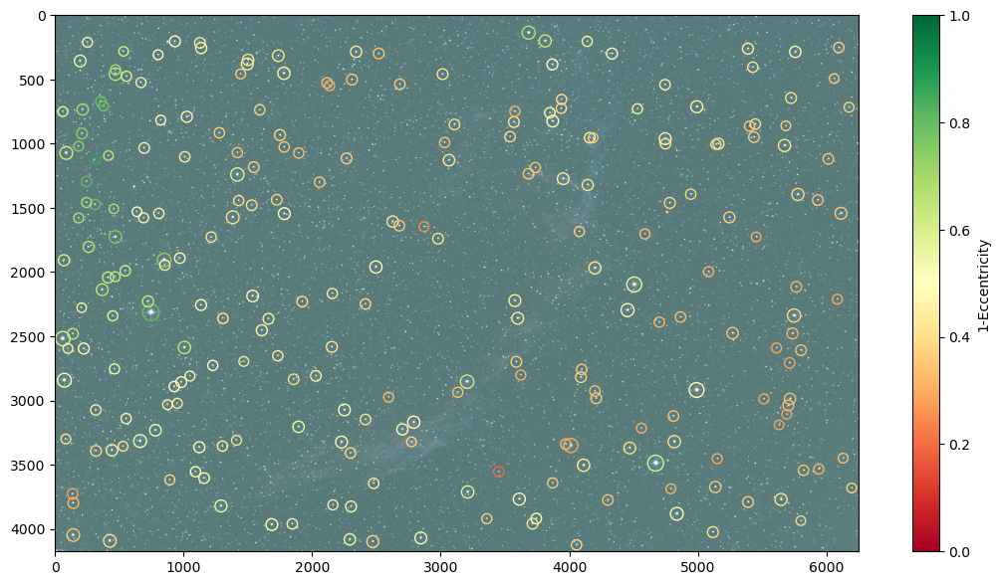

In [99]:
from matplotlib import colormaps
cmap = colormaps['RdYlGn']

for i,(img,stars) in enumerate(zip(light_calib_bkg_set,reg_stars)):
    print(f'Image {i} FWHM {np.mean(stars[:,2]):0.3f} ECC {np.mean(stars[:,5]):0.3f}')
    plt.figure(figsize=[14,7])
    odp.display_rgb(img,scale='linear',clip_sigmas=5)
    sc = plt.scatter(stars[:,0], stars[:,1], s=10*stars[:,2], fc='none', ec=cmap(1.0-stars[:,5]))
    plt.colorbar(sc,label='1-Eccentricity')
    sc.set_cmap(cmap)
    sc.set_clim(0,1)
    plt.show()
    plt.close()
    break

## Find Constellations

In [100]:
with mp.Pool(16) as pool:
    reg_consts = pool.map(odp.build_constellations,reg_stars)

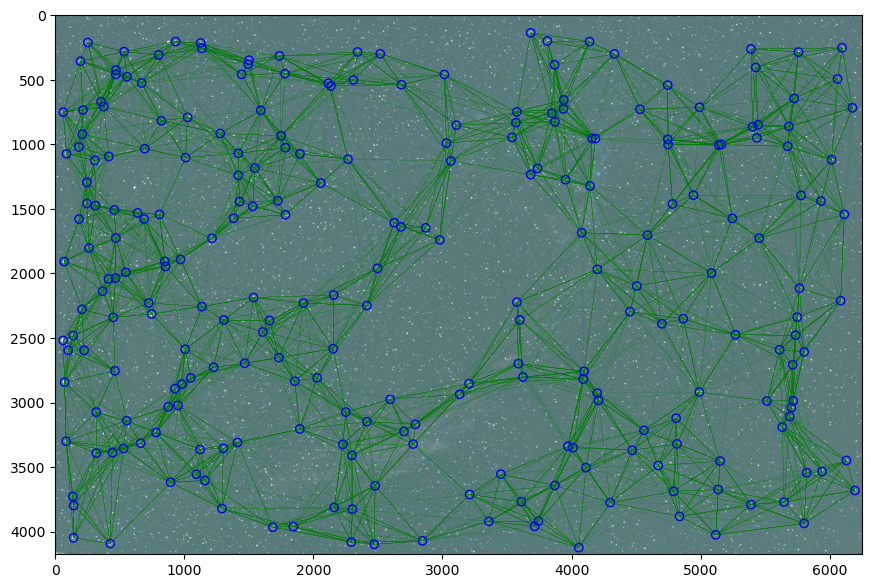

In [101]:
for i,(img,stars,tris) in enumerate(zip(light_calib_bkg_set,reg_stars,reg_consts)):
    plt.figure(figsize=[14,7])
    odp.display_rgb(img,scale='linear',clip_sigmas=5)
    odp.draw_constellations(tris, color='g', alpha=1.0, linewidth=0.1)
    plt.scatter(stars[:,0], stars[:,1], fc='none', ec='b')
    plt.show()
    plt.close()
    break

## Find Alignment Transformations

In [102]:
ref_idx = 0

import itertools
import functools

class ref_skip:
    '''For a starmap operation, this can wrap a function to skip processing a specific index and return 
       a fixed value (usually None) instead. Assumes whatever you would have iterated over with the bare 
       function is instead wrapped in enumerate'''
    
    def __init__(self, f, ref_idx, ref_val=None):
        self.f = f
        self.ref_idx = ref_idx
        self.ref_val = ref_val
        
    def __call__(self, i, args, **kwargs):
        if i == self.ref_idx:
            return self.ref_val
        else:
            return self.f(*args, **kwargs)

ft = functools.partial(odp.find_transformation, max_iter=10)

with mp.Pool(16) as pool:
    const_pairs = pool.starmap(ref_skip(odp.find_corresponding_constellations,ref_idx), enumerate(zip(itertools.repeat(reg_consts[ref_idx]),reg_consts)))
    star_pairs = pool.starmap(ref_skip(odp.find_corresponding_points,ref_idx), enumerate(const_pairs))
    fit_txs = pool.starmap(ref_skip(ft,ref_idx), enumerate(star_pairs))

Image 1
          message: Optimization terminated successfully.
          success: True
           status: 0
              fun: 0.19069801967287395
                x: [ 1.054e+01 -4.680e+01 -3.443e-06]
              nit: 6
            direc: [[-8.314e-02  8.453e-02  2.288e-05]
                    [ 0.000e+00  1.000e+00  0.000e+00]
                    [ 4.310e-04  6.198e-04  3.789e-07]]
             nfev: 238
 average_distance: 0.19069801967287395
      total_stars: 238
        star_mask: [ True  True ...  True  True]


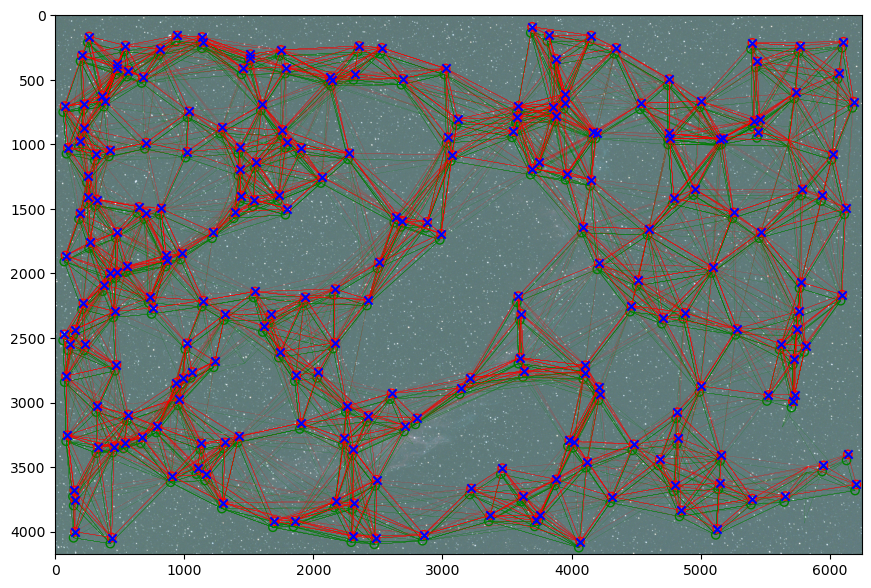

Image 2
          message: Optimization terminated successfully.
          success: True
           status: 0
              fun: 0.2824628777518718
                x: [ 3.614e+01 -5.638e+01 -3.343e-06]
              nit: 6
            direc: [[ 3.227e-02 -1.665e-02 -6.666e-06]
                    [ 0.000e+00  1.000e+00  0.000e+00]
                    [-2.450e-04 -2.716e-03 -1.303e-06]]
             nfev: 255
 average_distance: 0.2824628777518718
      total_stars: 227
        star_mask: [ True  True ...  True  True]


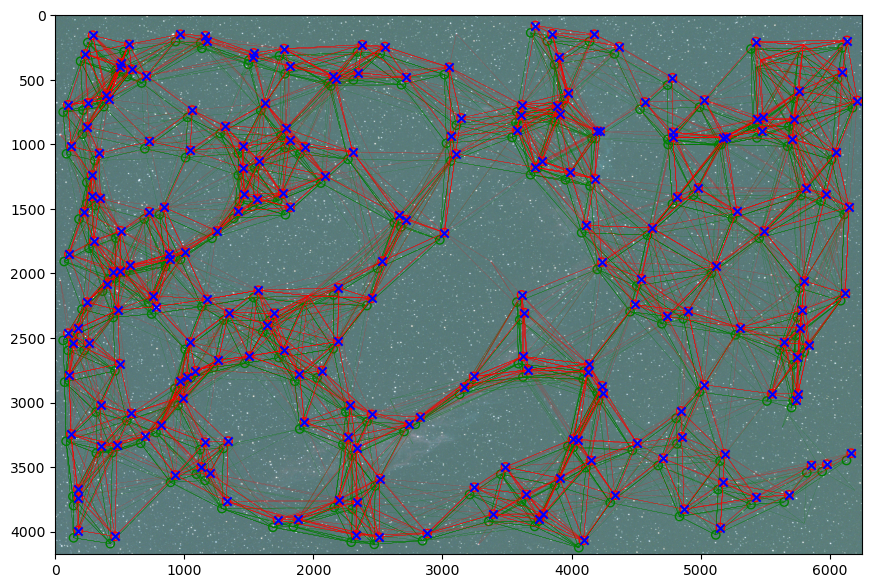

In [103]:
for i,(img,stars,tris,fit) in enumerate(zip(light_calib_bkg_set,star_pairs,const_pairs,fit_txs)):
    if ref_idx == i:
        continue
    print(f'Image {i}')
    
    print(fit)
    plt.figure(figsize=[14,7])
    odp.display_rgb(img,scale='linear',clip_sigmas=5)
    stars_a,stars_b,mean_rot,mean_tx = stars
    tris_a,tris_b = tris
    odp.draw_constellations(tris_a, color='g', alpha=1.0, linewidth=0.1)
    plt.scatter(stars_a[fit.star_mask,0], stars_a[fit.star_mask,1], fc='none', ec='g')
    odp.draw_constellations(tris_b, color='r', alpha=1.0, linewidth=0.1)
    plt.scatter(stars_b[fit.star_mask,0], stars_b[fit.star_mask,1], fc='none', ec='r')
    stars_a_tx = odp.transform_coords(stars_a[fit.star_mask,:2],*fit.x)
    plt.scatter(stars_a_tx[:,0], stars_a_tx[:,1], c='b', marker='x')
    plt.show()
    plt.close()
    if i >= 2: break

## Image Selection

Based on metrics determined during star finding and alignment.

Text(0.5, 0, 'eccentricity')

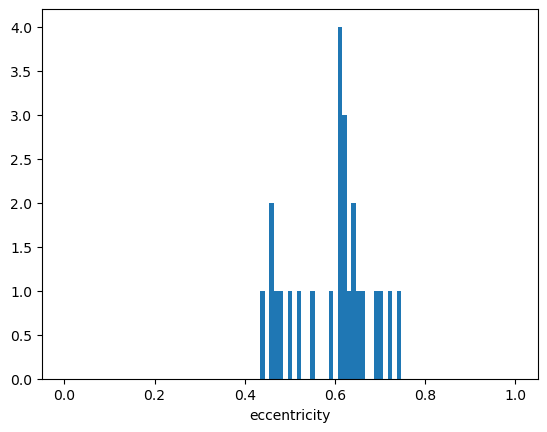

In [104]:
eccentricity = np.asarray([np.mean(star[:,5]) for star in reg_stars])
plt.hist(eccentricity,bins=np.linspace(0,1,100))
plt.xlabel('eccentricity')

Text(0.5, 0, 'fwhm')

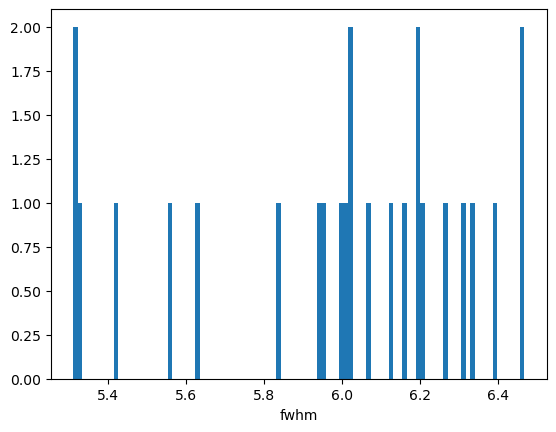

In [105]:
fwhm = np.asarray([np.mean(star[:,2]) for star in reg_stars])
plt.hist(np.clip([np.mean(star[:,2]) for star in reg_stars],0,10),bins=100)
plt.xlabel('fwhm')

Text(0.5, 0, 'total stars')

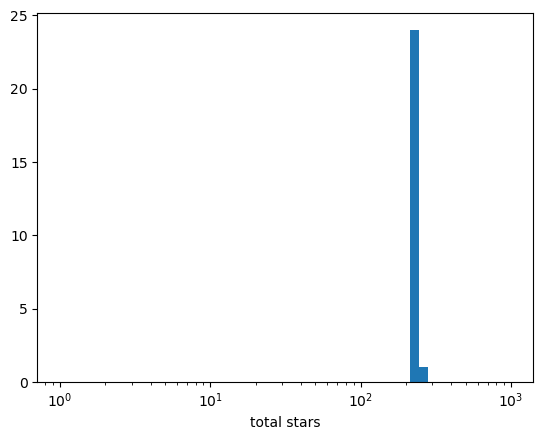

In [106]:
total_stars = np.asarray([fit.total_stars if fit else len(reg_stars[ref_idx]) for fit in fit_txs ])
plt.hist(total_stars,bins=np.logspace(0,3))
plt.xscale('log')
plt.xlabel('total stars')

Text(0.5, 0, 'average tx distance')

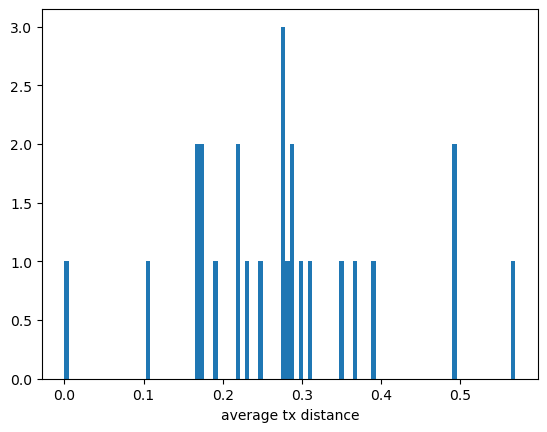

In [107]:
avg_dist = np.asarray([fit.average_distance if fit else 0.0 for fit in fit_txs ])
plt.hist(np.clip(avg_dist,0,10),bins=100)
plt.xlabel('average tx distance')

[ True  True  True False  True  True False  True False  True  True  True
  True  True  True  True  True  True  True  True False False False  True
  True]
Total Lights: 25; Lights Used: 19
Rejected 3: FWHM 5.317459377364634 ECC 0.48338046727181727 TOT 225 DIST 0.23078114503442665


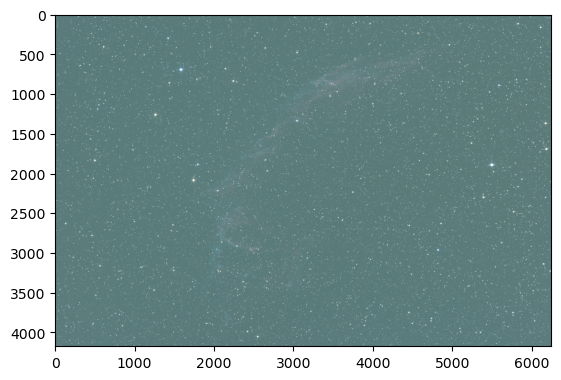

Rejected 6: FWHM 5.946784239080832 ECC 0.6241228138052836 TOT 228 DIST 0.569301905195518


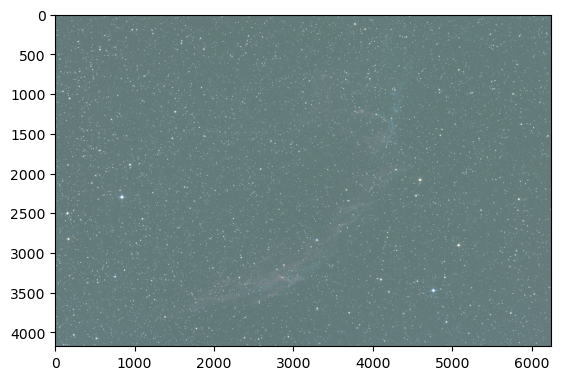

Rejected 8: FWHM 5.554738700319152 ECC 0.46958615553251754 TOT 229 DIST 0.28587993572600234


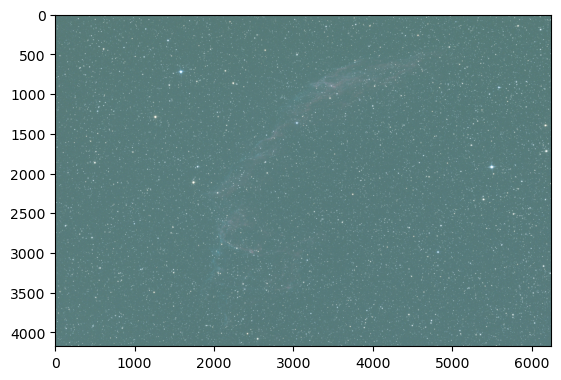

Rejected 20: FWHM 5.632082537621628 ECC 0.43944792386243803 TOT 219 DIST 0.2449032946041429


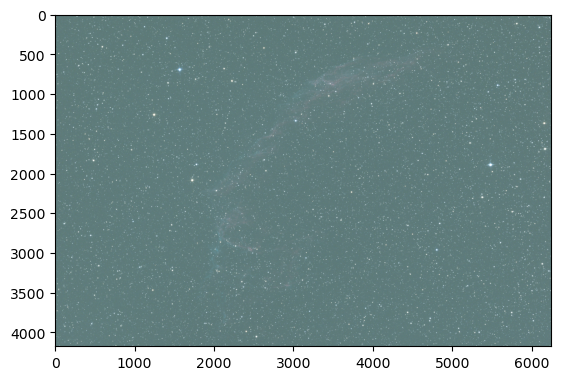

Rejected 21: FWHM 5.311580084393272 ECC 0.45887970044305304 TOT 227 DIST 0.30804181391189106


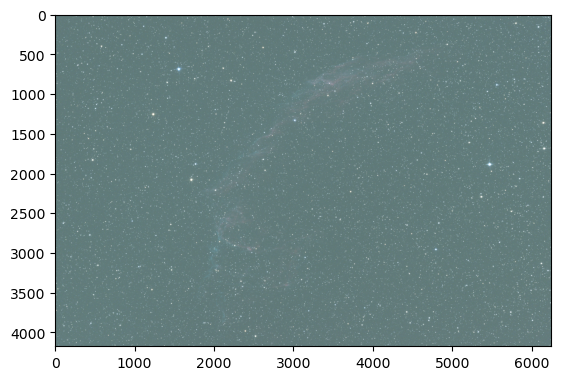

Rejected 22: FWHM 5.327960729716844 ECC 0.4586296970933761 TOT 218 DIST 0.38883635894973717


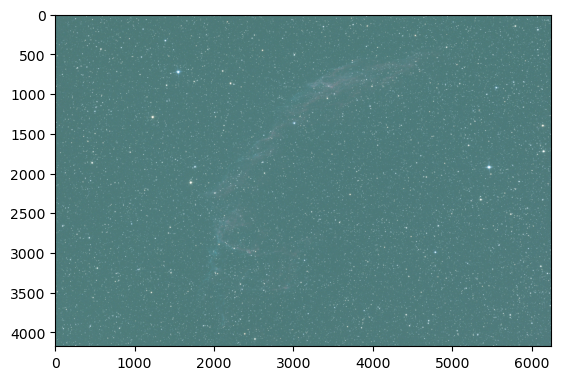

In [108]:
def median_sigma_cut(values, sigmas, **kwargs):
    m,s = np.median(values, **kwargs),np.std(values, **kwargs)
    return np.abs(values - m) < sigmas*s

def median_sigma_max_cut(values, sigmas, **kwargs):
    m,s = np.median(values, **kwargs),np.std(values, **kwargs)
    return values - m < sigmas*s
    
def median_sigma_min_cut(values, sigmas, **kwargs):
    m,s = np.median(values, **kwargs),np.std(values, **kwargs)
    return m - values < sigmas*s

star_selection = median_sigma_max_cut(fwhm, 1.5) & median_sigma_min_cut(eccentricity, 1.5)
fit_selection = (total_stars >= 10) & median_sigma_max_cut(avg_dist, 2)
selection = star_selection & fit_selection
print(selection)
print(f'Total Lights: {len(selection)}; Lights Used: {np.count_nonzero(selection)}')
for i,sel in enumerate(selection):
    if not sel:
        print(f'Rejected {i}: FWHM {fwhm[i]} ECC {eccentricity[i]} TOT {total_stars[i]} DIST {avg_dist[i]}')
        odp.display_rgb(light_calib_bkg_set[i],scale='linear',clip_sigmas=5)
        plt.show()
        plt.close()

## Transform Images

In [109]:
transformed_shape = tuple((x*2 if DRIZZLE else x) if i < 2 else x for i,x in enumerate(light_calib_bkg_set.img_shape))

light_regtx = odp.DiskSet('light_calib_bkg_reg.apy', recreate=True, dtype=DTYPE, num_img=np.count_nonzero(selection), img_shape=transformed_shape)

with odp.ImageProcessor(nproc=16) as proc:
    proc.map(odp.image_transform_chunked, light_calib_bkg_set, fit_txs, drizzle=DRIZZLE, output_set=light_regtx, selection=selection, verbose=True)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:56<00:00,  2.98s/it]


## Stacking (Winsor Implementation)

In [110]:
summed,counts = odp.winsor_stack(light_regtx, nproc=16, verbose=True, return_counts=True)

Stacking with winzor quantiles [0.030, 0.970]
Total jobs to run: 117


Winsor quantiles:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 102/117 [02:14<00:08,  1.80it/s]/mnt/scratch/astropy/oscdeeppy/stacking.py:58: RuntimeWarning: All-NaN slice encountered
  patch_median = np.nanmedian(patches, axis=0)
Winsor quantiles: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 117/117 [02:19<00:00,  1.19s/it]


In [111]:
np.count_nonzero(counts==0)

396

In [112]:
np.count_nonzero(np.isnan(counts))

0

In [113]:
stacked = summed/np.clip(counts,1,None)

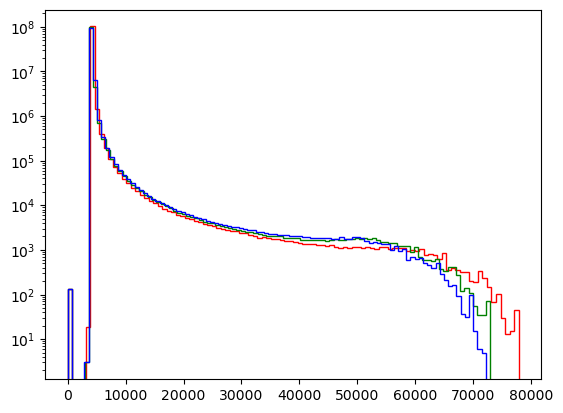

In [114]:
odp.show_hist(stacked)

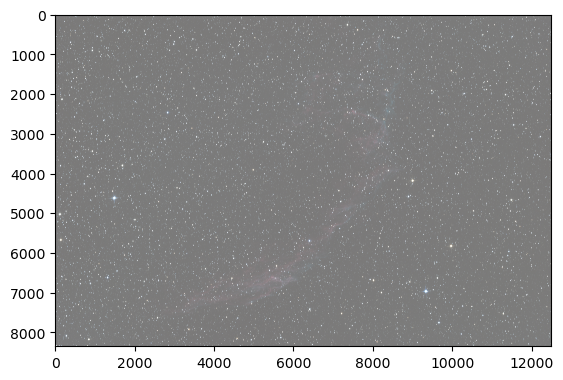

In [115]:
odp.display_rgb(stacked, scale='linear', clip_sigmas=5)

# Post-Processing

All the calibration, alignment, and stacking up to now has been pre-processing necessary to get one single image. From here the image is manipulated to arrive at something visually meaningful.

In [116]:
median_value = np.median(stacked)

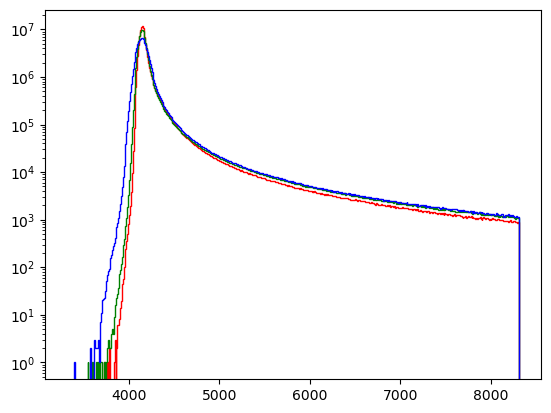

In [117]:
odp.show_hist(stacked, bins=np.linspace(median_value*0.8,median_value*2,500))
plt.yscale('log')

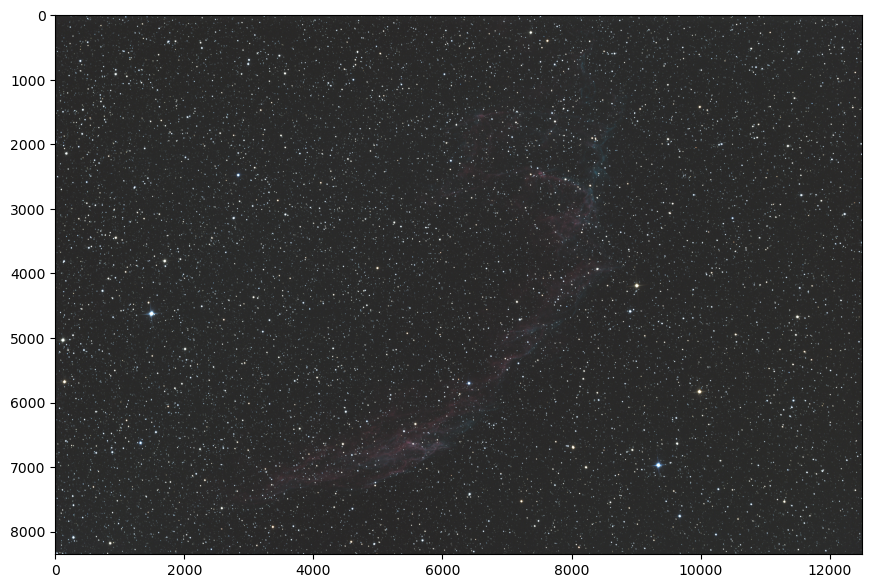

In [118]:
odp.linear_rgb(stacked, lower_limit=median_value*0.8, upper_limit=median_value*2, quality=95)

## Background Extraction

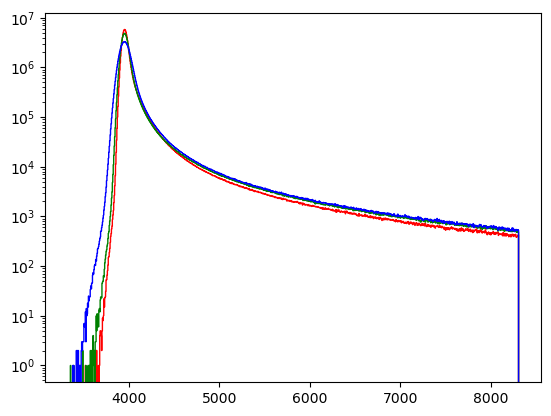

In [119]:
stacked_bkg,bkg = odp.polyfit_bkg_extract(stacked,order=5,return_bkg=True)
odp.show_hist(stacked_bkg, bins=np.linspace(median_value*0.8,median_value*2,1000))

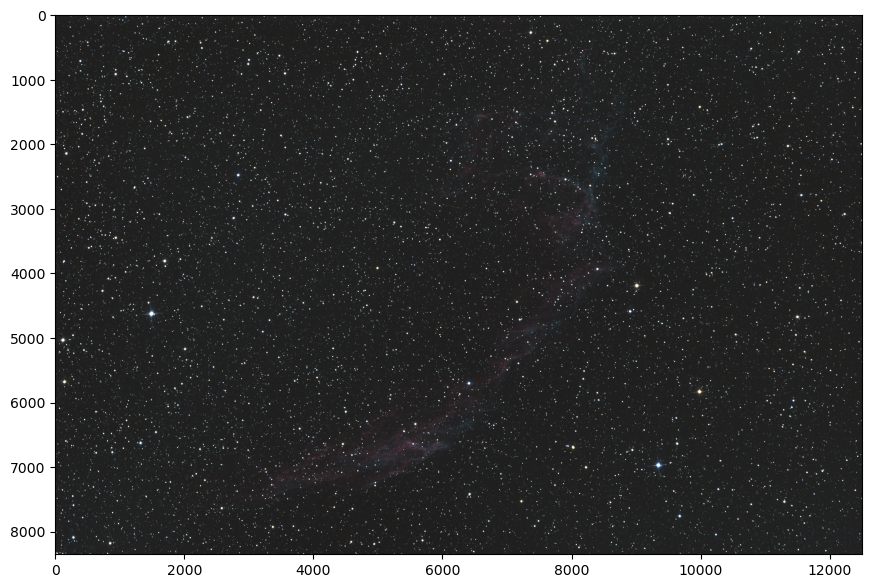

In [120]:
odp.linear_rgb(stacked_bkg, lower_limit=median_value*0.8, upper_limit=median_value*2, quality=95)

## Equalize

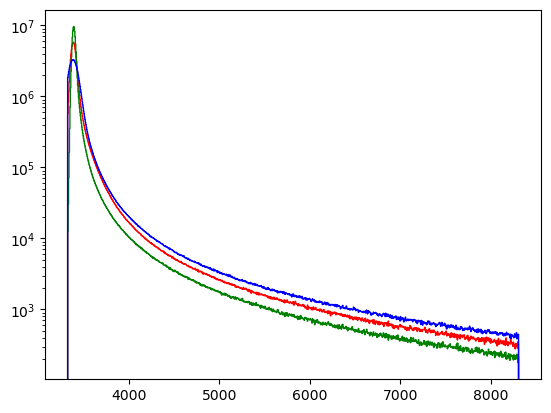

In [121]:
stacked_bkg_eq_base,med,sig  = odp.equalize_img(stacked_bkg, get_stats=True)
odp.show_hist(stacked_bkg_eq_base, bins=np.linspace(median_value*0.8,median_value*2,1000))

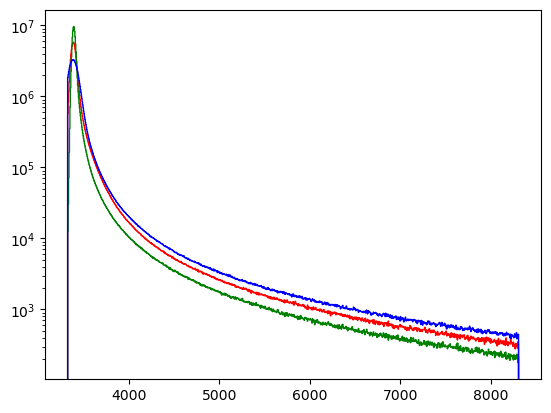

In [122]:
#scale = np.asarray([1.15,0.985,1.0],dtype=DTYPE)
scale = np.asarray([1.0,1.0,1.0],dtype=DTYPE)
stacked_bkg_eq = stacked_bkg_eq_base*scale-med*(scale-1)
odp.show_hist(stacked_bkg_eq, bins=np.linspace(median_value*0.8,median_value*2,1000))

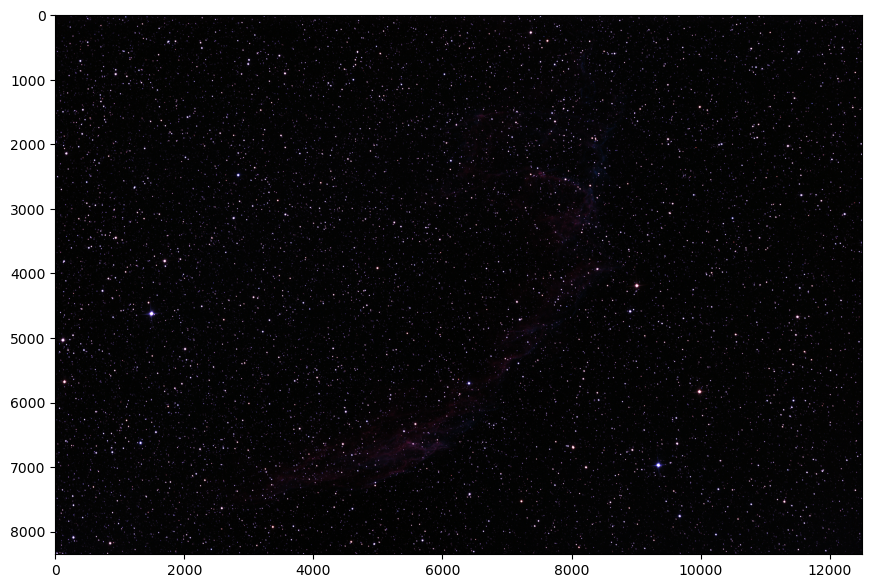

In [123]:
odp.linear_rgb(stacked_bkg_eq, lower_limit=median_value*0.8, upper_limit=median_value*2, quality=95)

## Blackpoint and Whitepoint

Convert from arbitrary (12-16 bit) scale to represented as DTYPE to normalized [0,1] as DTYPE from here on

In [124]:
from scipy.optimize import minimize

def histogram_metrics(rgb):
    hist_median,hist_sigma = np.median(rgb),np.std(rgb)
    counts,edges = np.histogram(rgb,bins=np.linspace(hist_median-hist_sigma*2,hist_median+hist_sigma*2,500))
    centers = (edges[:-1]+edges[1:])/2
    
    fit = minimize(odp.hist_bkg_residual(centers, counts), (hist_median,hist_sigma,0,np.max(rgb)), method='Nelder-Mead')
    fit.bkg_mean,fit.bkg_sig,fit.bkg_bkg,fit.bkg_peak = fit.x
    fit.hist_median,fit.hist_sigma = hist_median,hist_sigma
    
    return fit

odp.histogram_metrics = histogram_metrics

In [125]:
hist_fit = odp.histogram_metrics(stacked_bkg_eq)
hist_fit

       message: Optimization terminated successfully.
       success: True
        status: 0
           fun: 123332142213614.75
             x: [ 3.390e+03  2.135e+01 -3.974e+00  3.103e+07]
           nit: 319
          nfev: 640
 final_simplex: (array([[ 3.390e+03,  2.135e+01, -3.974e+00,  3.103e+07],
                       [ 3.390e+03,  2.135e+01, -3.974e+00,  3.103e+07],
                       ...,
                       [ 3.390e+03,  2.135e+01, -3.974e+00,  3.103e+07],
                       [ 3.390e+03,  2.135e+01, -3.974e+00,  3.103e+07]]), array([ 1.233e+14,  1.233e+14,  1.233e+14,  1.233e+14,
                        1.233e+14]))
      bkg_mean: 3390.307900177081
       bkg_sig: 21.354468121893902
       bkg_bkg: -3.9736171598032834
      bkg_peak: 31031891.54309979
   hist_median: 3395.1167
    hist_sigma: 1131.7056

In [126]:
bp,wp,light_pp = odp.set_blackpoint_and_norm(stacked_bkg_eq, blackpoint=hist_fit.hist_median-BLACKPOINT_SIGMA*abs(hist_fit.bkg_sig))
print(f'Blackpoint {bp}; Whitepoint {wp}')
symmetry_point = (hist_fit.hist_median+SYMMETRY_SIGMA*abs(hist_fit.bkg_sig)-bp)/(wp-bp)
bkg_peak = (hist_fit.bkg_mean-bp)/(wp-bp)
print(f'Bkg Peak Location: {bkg_peak}; Optimal Stretch Symmetry: {symmetry_point}')

Blackpoint 3337.4596352896365; Whitepoint 65580.65625
Bkg Peak Location: 0.0008490609056372703; Optimal Stretch Symmetry: 0.0010978597132961264


## Stretching

Using the [Generalized Hyperbolic Stretch](https://www.ghsastro.co.uk/doc/tools/GeneralizedHyperbolicStretch/GeneralizedHyperbolicStretch.html) strategy.

In [127]:
ghs_args = dict(symmetry_point=symmetry_point, form=1.0)
stretch_fit = minimize(odp.optimal_ghs_stretch(bkg_peak,0.09,symmetry_point=symmetry_point,form=1.0), 1, method='Powell')
print(stretch_fit)
ghs_args['stretch_factor'], = stretch_fit.x
print(ghs_args)

 message: Optimization terminated successfully.
 success: True
  status: 0
     fun: 6.257346389314129e-31
       x: [ 4.973e+00]
     nit: 4
   direc: [[-8.907e-03]]
    nfev: 54
{'symmetry_point': np.float64(0.0010978597132961264), 'form': 1.0, 'stretch_factor': np.float64(4.973230117472672)}


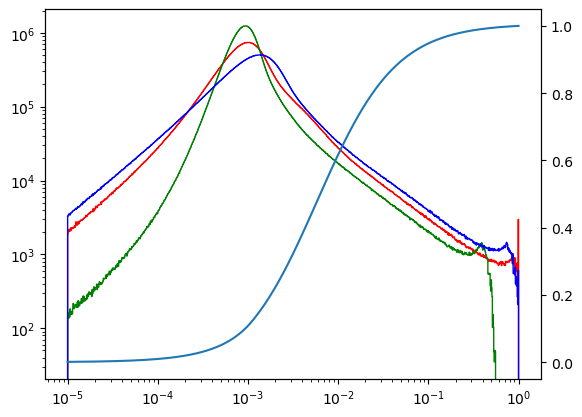

In [128]:
bins = np.logspace(-5,0,1000)
odp.show_hist(light_pp, bins=bins)
plt.xscale('log')
plt.twinx()

y = odp.ghs(bins, **ghs_args)
plt.plot(bins,y)

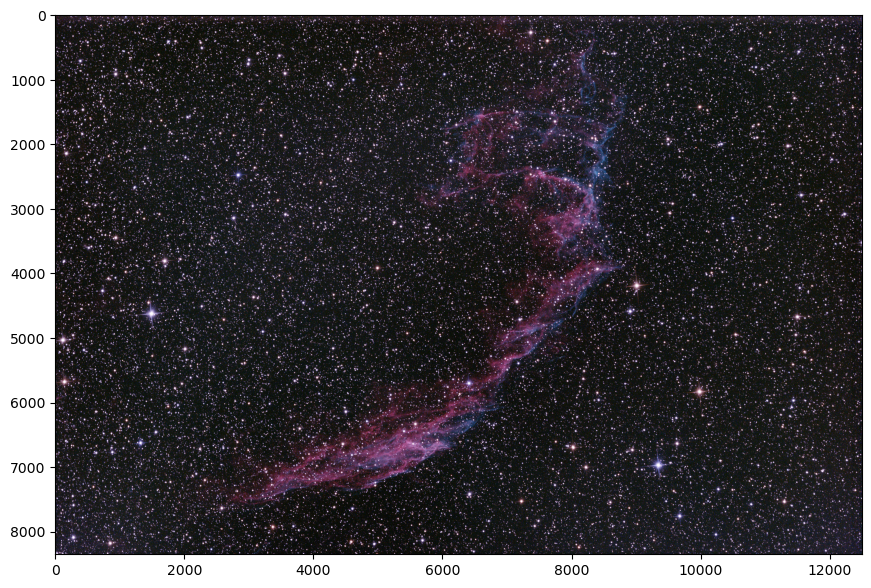

In [129]:
light_pp_ghs = odp.ghs(light_pp, **ghs_args)
odp.linear_rgb(light_pp_ghs, save=f'{tag}_pp_ghs.jpg', quality=95)

## HQ Output

For further manipulation

In [130]:
import cv2

In [131]:
data = np.flip(np.clip(light_pp_ghs*(2**16),0,2**16-1),axis=2).astype(dtype=np.uint16)
cv2.imwrite(f'{tag}.png',data)

True